In [53]:
#import libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [54]:
#para la revision, voy a intentar hacer el split primero como has hecho con la solucion 
from sklearn.model_selection import train_test_split

airbnb = pd.read_csv("C:\\Users\\katel\\Downloads\\airbnb-listings.csv", delimiter=';')
train, test = train_test_split(airbnb, test_size=0.2, shuffle=True, random_state=0)

print(f'Dimensiones del dataset de training: {train.shape}')
print(f'Dimensiones del dataset de test: {test.shape}')

# Guardamos
train.to_csv('./train.csv', sep=';', decimal='.', index=False)
test.to_csv('./test.csv', sep=';', decimal='.', index=False)


Dimensiones del dataset de training: (11824, 89)
Dimensiones del dataset de test: (2956, 89)


In [55]:
df = pd.read_csv('./train.csv', sep=';', decimal='.')

In [56]:
#ver el data set para saber cuales son las columnas que quiero eliminar
#de momento solo del train set
df.head

<bound method NDFrame.head of              ID                            Listing Url       Scrape ID  \
0       8308944   https://www.airbnb.com/rooms/8308944  20170407214119   
1      18104306  https://www.airbnb.com/rooms/18104306  20170407214050   
2      13060669  https://www.airbnb.com/rooms/13060669  20170407214119   
3      17134080  https://www.airbnb.com/rooms/17134080  20170407214119   
4      10464183  https://www.airbnb.com/rooms/10464183  20170407214119   
5      17645727  https://www.airbnb.com/rooms/17645727  20170407214119   
6      12201598  https://www.airbnb.com/rooms/12201598  20170407214119   
7      15785030  https://www.airbnb.com/rooms/15785030  20170407214119   
8       5981095   https://www.airbnb.com/rooms/5981095  20170407214119   
9       8509461   https://www.airbnb.com/rooms/8509461  20170407214119   
10     14366176  https://www.airbnb.com/rooms/14366176  20170407214119   
11     14597062  https://www.airbnb.com/rooms/14597062  20170407214119   
12      

In [57]:
#see value types
print(df.dtypes)

ID                                  int64
Listing Url                        object
Scrape ID                           int64
Last Scraped                       object
Name                               object
Summary                            object
Space                              object
Description                        object
Experiences Offered                object
Neighborhood Overview              object
Notes                              object
Transit                            object
Access                             object
Interaction                        object
House Rules                        object
Thumbnail Url                      object
Medium Url                         object
Picture Url                        object
XL Picture Url                     object
Host ID                             int64
Host URL                           object
Host Name                          object
Host Since                         object
Host Location                     

In [58]:
df.columns

Index(['ID', 'Listing Url', 'Scrape ID', 'Last Scraped', 'Name', 'Summary',
       'Space', 'Description', 'Experiences Offered', 'Neighborhood Overview',
       'Notes', 'Transit', 'Access', 'Interaction', 'House Rules',
       'Thumbnail Url', 'Medium Url', 'Picture Url', 'XL Picture Url',
       'Host ID', 'Host URL', 'Host Name', 'Host Since', 'Host Location',
       'Host About', 'Host Response Time', 'Host Response Rate',
       'Host Acceptance Rate', 'Host Thumbnail Url', 'Host Picture Url',
       'Host Neighbourhood', 'Host Listings Count',
       'Host Total Listings Count', 'Host Verifications', 'Street',
       'Neighbourhood', 'Neighbourhood Cleansed',
       'Neighbourhood Group Cleansed', 'City', 'State', 'Zipcode', 'Market',
       'Smart Location', 'Country Code', 'Country', 'Latitude', 'Longitude',
       'Property Type', 'Room Type', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Bed Type', 'Amenities', 'Square Feet', 'Price', 'Weekly Price',
       'Month

In [59]:
#definir las columnas que quiero dropear
to_drop = ["ID", "Listing Url", "Scrape ID", "Last Scraped", "Thumbnail Url", "Medium Url", "Picture Url", "XL Picture Url", "Host URL", "Host Thumbnail Url", "Host Picture Url", "Latitude", "Longitude", "Calendar last Scraped"]
df = df.drop(to_drop, axis =1)
df.columns

Index(['Name', 'Summary', 'Space', 'Description', 'Experiences Offered',
       'Neighborhood Overview', 'Notes', 'Transit', 'Access', 'Interaction',
       'House Rules', 'Host ID', 'Host Name', 'Host Since', 'Host Location',
       'Host About', 'Host Response Time', 'Host Response Rate',
       'Host Acceptance Rate', 'Host Neighbourhood', 'Host Listings Count',
       'Host Total Listings Count', 'Host Verifications', 'Street',
       'Neighbourhood', 'Neighbourhood Cleansed',
       'Neighbourhood Group Cleansed', 'City', 'State', 'Zipcode', 'Market',
       'Smart Location', 'Country Code', 'Country', 'Property Type',
       'Room Type', 'Accommodates', 'Bathrooms', 'Bedrooms', 'Beds',
       'Bed Type', 'Amenities', 'Square Feet', 'Price', 'Weekly Price',
       'Monthly Price', 'Security Deposit', 'Cleaning Fee', 'Guests Included',
       'Extra People', 'Minimum Nights', 'Maximum Nights', 'Calendar Updated',
       'Has Availability', 'Availability 30', 'Availability 60',
    

In [60]:
#quedarme con las entradas de Madrid
df = df[df['City'] == 'Madrid']
#check to see if it worked
city_column = df['City']
print(city_column)

0        Madrid
2        Madrid
3        Madrid
4        Madrid
5        Madrid
6        Madrid
7        Madrid
8        Madrid
9        Madrid
10       Madrid
11       Madrid
12       Madrid
13       Madrid
14       Madrid
15       Madrid
16       Madrid
18       Madrid
19       Madrid
20       Madrid
21       Madrid
22       Madrid
23       Madrid
24       Madrid
25       Madrid
26       Madrid
27       Madrid
28       Madrid
29       Madrid
30       Madrid
31       Madrid
33       Madrid
35       Madrid
36       Madrid
37       Madrid
38       Madrid
40       Madrid
41       Madrid
42       Madrid
43       Madrid
45       Madrid
46       Madrid
47       Madrid
48       Madrid
49       Madrid
51       Madrid
52       Madrid
53       Madrid
54       Madrid
55       Madrid
56       Madrid
58       Madrid
60       Madrid
61       Madrid
63       Madrid
64       Madrid
66       Madrid
67       Madrid
69       Madrid
70       Madrid
71       Madrid
72       Madrid
73       Madrid
75      

In [61]:
#check for NAs and NaNs
pd.options.display.max_rows = None
missing_values = df.isna()
#count of missing values
missing_count = missing_values.sum()
print(missing_count)
#after splitting into test and train, I will need to drop the values and see what i want to replace them with

Name                                  0
Summary                             394
Space                              2810
Description                           5
Experiences Offered                   0
Neighborhood Overview              3920
Notes                              6556
Transit                            3948
Access                             4491
Interaction                        4531
House Rules                        3683
Host ID                               0
Host Name                             2
Host Since                            2
Host Location                        32
Host About                         3980
Host Response Time                 1345
Host Response Rate                 1345
Host Acceptance Rate              10563
Host Neighbourhood                 2597
Host Listings Count                   2
Host Total Listings Count             2
Host Verifications                    5
Street                                0
Neighbourhood                      3549


In [62]:
columns_missing_values = [
    'Host Acceptance Rate', 'Square Feet', 'Has Availability', 'License', 'Jurisdiction Names'
]

df.drop(columns_missing_values, axis=1, inplace=True)

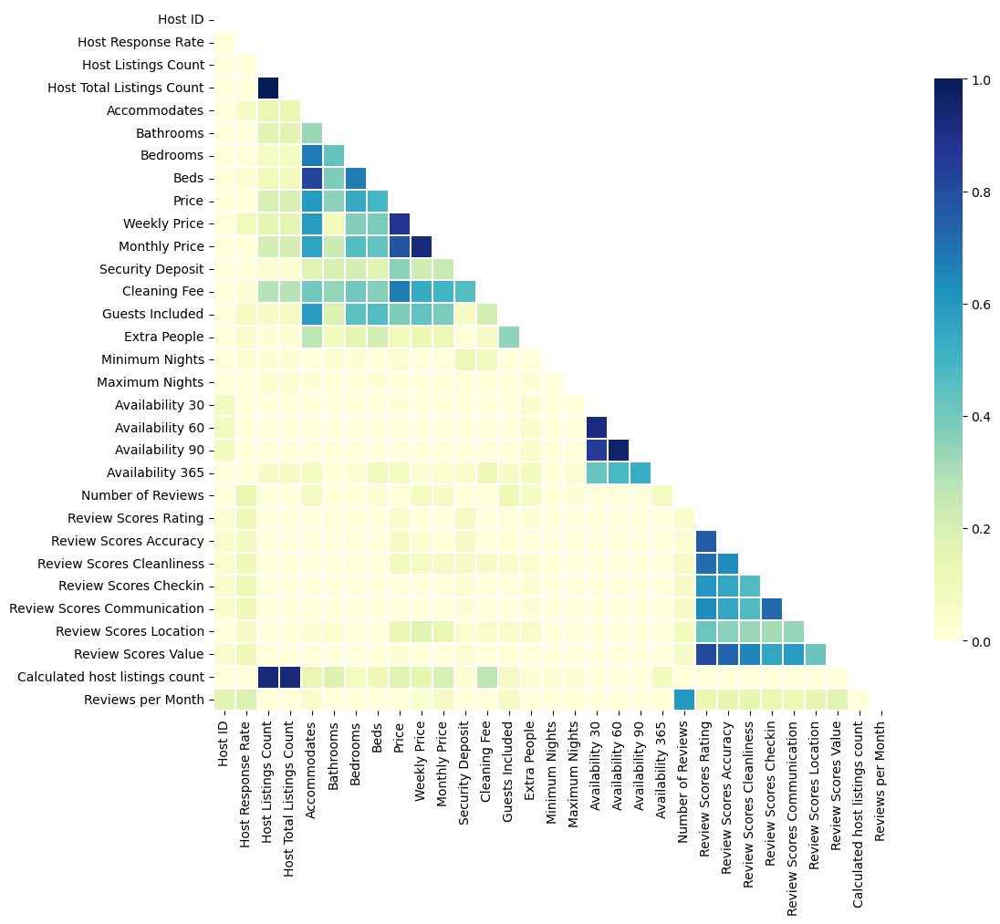

In [63]:
#hacer the correlation matrix to see which variables are strongly related
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

correlation_matrix_train = df.corr()

#set threshold for correlations
mask = np.zeros_like(correlation_matrix_train, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix_train, mask=mask,vmin = 0.0, vmax=1.0, center=0.5,
            linewidths=.1, cmap="YlGnBu", cbar_kws={"shrink": .8})

plt.show()

In [64]:
print(df.describe())

            Host ID  Host Response Rate  Host Listings Count  \
count  1.056300e+04         9218.000000         10561.000000   
mean   3.741339e+07           94.889347             9.771328   
std    3.434658e+07           15.116018            27.406250   
min    1.745300e+04            0.000000             0.000000   
25%    7.772098e+06          100.000000             1.000000   
50%    2.752699e+07          100.000000             2.000000   
75%    5.740587e+07          100.000000             5.000000   
max    1.247534e+08          100.000000           207.000000   

       Host Total Listings Count  Accommodates     Bathrooms      Bedrooms  \
count               10561.000000  10563.000000  10521.000000  10547.000000   
mean                    9.771328      3.194263      1.255822      1.290699   
std                    27.406250      2.003438      0.606540      0.823093   
min                     0.000000      1.000000      0.000000      0.000000   
25%                     1.000000 

In [13]:
#no sé si hacer esto
#filter dataframe to see strong correlations only
#unstack
#matrix_df = matrix_df.unstack()
#matrix_df[abs(matrix_df) >= 0.5]

In [65]:
print(test.shape)
print(df.shape)

(2956, 89)
(11824, 89)
(10563, 70)


In [66]:
test.head

<bound method NDFrame.head of              ID                            Listing Url       Scrape ID  \
9612    8900002   https://www.airbnb.com/rooms/8900002  20170407214119   
4447   17954869  https://www.airbnb.com/rooms/17954869  20170407214119   
8936    5833459   https://www.airbnb.com/rooms/5833459  20170407214119   
4006   15879980  https://www.airbnb.com/rooms/15879980  20170407214119   
13853   4478796   https://www.airbnb.com/rooms/4478796  20170407214119   
8900    7952687   https://www.airbnb.com/rooms/7952687  20170407214119   
5939   11618535  https://www.airbnb.com/rooms/11618535  20170407214119   
6204   14146204  https://www.airbnb.com/rooms/14146204  20170407214119   
10640   9605711   https://www.airbnb.com/rooms/9605711  20170407214119   
2192    3229124   https://www.airbnb.com/rooms/3229124  20170407214119   
11142   1359886   https://www.airbnb.com/rooms/1359886  20170407214119   
13199  10852802  https://www.airbnb.com/rooms/10852802  20170407214119   
7327   1

In [67]:
#fill in missing navalues with average
test.fillna(test.mean(), inplace=True)

In [68]:
print(test.shape)

(2956, 89)


In [92]:
# Create a Min-Max scaler
scaler = MinMaxScaler()

# Fit and transform the training set
train_normalized = df.copy()
train_normalized[num_features] = scaler.fit_transform(df[num_features])

# Transform the test set using the same scaler
test_normalized = test.copy()
test_normalized[num_features] = scaler.transform(test[num_features])

In [93]:
#apply same pre processig to test data
#definir las columnas que quiero dropear
to_drop = ["ID", "Listing Url", "Scrape ID", "Last Scraped", "Thumbnail Url", "Medium Url", "Picture Url", "XL Picture Url", "Host URL", "Host Thumbnail Url", "Host Picture Url", "Latitude", "Longitude", "Calendar last Scraped"]
test_normalized = test_normalized.drop(to_drop, axis =1)
test_normalized.columns

Index(['Name', 'Summary', 'Space', 'Description', 'Experiences Offered',
       'Neighborhood Overview', 'Notes', 'Transit', 'Access', 'Interaction',
       'House Rules', 'Host ID', 'Host Name', 'Host Since', 'Host Location',
       'Host About', 'Host Response Time', 'Host Response Rate',
       'Host Acceptance Rate', 'Host Neighbourhood', 'Host Listings Count',
       'Host Total Listings Count', 'Host Verifications', 'Street',
       'Neighbourhood', 'Neighbourhood Cleansed',
       'Neighbourhood Group Cleansed', 'City', 'State', 'Zipcode', 'Market',
       'Smart Location', 'Country Code', 'Country', 'Property Type',
       'Room Type', 'Accommodates', 'Bathrooms', 'Bedrooms', 'Beds',
       'Bed Type', 'Amenities', 'Square Feet', 'Price', 'Weekly Price',
       'Monthly Price', 'Security Deposit', 'Cleaning Fee', 'Guests Included',
       'Extra People', 'Minimum Nights', 'Maximum Nights', 'Calendar Updated',
       'Has Availability', 'Availability 30', 'Availability 60',
    

In [94]:
#quedarme con las entradas de Madrid
test_normalized = test_normalized[test_normalized['City'] == 'Madrid']
test_city_column = test_normalized['City']
print(test_city_column)

9612     Madrid
4447     Madrid
8936     Madrid
4006     Madrid
13853    Madrid
8900     Madrid
5939     Madrid
6204     Madrid
10640    Madrid
2192     Madrid
11142    Madrid
13199    Madrid
7327     Madrid
1875     Madrid
13076    Madrid
11159    Madrid
7186     Madrid
3673     Madrid
14488    Madrid
214      Madrid
8692     Madrid
12328    Madrid
5822     Madrid
9228     Madrid
8066     Madrid
4115     Madrid
12368    Madrid
13612    Madrid
10317    Madrid
7582     Madrid
9824     Madrid
7755     Madrid
14565    Madrid
7862     Madrid
6005     Madrid
2746     Madrid
13398    Madrid
9561     Madrid
11028    Madrid
8491     Madrid
3032     Madrid
7006     Madrid
4898     Madrid
9902     Madrid
13609    Madrid
5664     Madrid
10083    Madrid
1775     Madrid
7722     Madrid
6409     Madrid
5614     Madrid
6766     Madrid
12732    Madrid
5485     Madrid
13383    Madrid
10095    Madrid
2436     Madrid
950      Madrid
5704     Madrid
3488     Madrid
12757    Madrid
1078     Madrid
6236    

In [95]:
#i shouldnt have missing values, but lets just double check for consistency
missing_values_test = test_normalized.isna()
missing_count_test = missing_values_test.sum()
print(missing_count_test)

Name                                 0
Summary                             94
Space                              752
Description                          1
Experiences Offered                  0
Neighborhood Overview             1018
Notes                             1645
Transit                           1039
Access                            1214
Interaction                       1191
House Rules                        965
Host ID                              0
Host Name                            1
Host Since                           1
Host Location                       10
Host About                         992
Host Response Time                 310
Host Response Rate                   0
Host Acceptance Rate              2644
Host Neighbourhood                 652
Host Listings Count                  0
Host Total Listings Count            0
Host Verifications                   1
Street                               0
Neighbourhood                      905
Neighbourhood Cleansed   

In [96]:
test_columns_missing_values = [
    'Host Acceptance Rate', 'Square Feet', 'Has Availability', 'License', 'Jurisdiction Names'
]

test_normalized.drop(columns_missing_values, axis=1, inplace=True)

In [145]:
# Splitting the train DataFrame into X_train and y_train to exclude the target variable
X_train = train_normalized.drop('Price', axis=1)  
y_train = train_normalized['Price']  

# Splitting the test DataFrame into X_test and y_test
X_test = test_normalized.drop('Price', axis=1)  
y_test = test_normalized['Price']  

In [146]:
# Check if there are non-numeric columns in train_normalized
non_numeric_columns_train = train_normalized.select_dtypes(exclude=['number']).columns

# Check if there are non-numeric columns in test_normalized
non_numeric_columns_test = test_normalized.select_dtypes(exclude=['number']).columns

# Print the non-numeric columns for both DataFrames
print("Non-numeric columns in train_normalized:", non_numeric_columns_train)
print("Non-numeric columns in test_normalized:", non_numeric_columns_test)


Non-numeric columns in train_normalized: Index([], dtype='object')
Non-numeric columns in test_normalized: Index([], dtype='object')


In [99]:
# List of non-numeric columns
non_numeric_columns = train_normalized.select_dtypes(exclude='number').columns

# Drop non-numeric columns from both train_normalized and test_normalized
train_normalized = train_normalized.drop(non_numeric_columns, axis=1)
test_normalized = test_normalized.drop(non_numeric_columns, axis=1)


In [100]:
# Check for NaN values in train_normalized
nan_check_train = train_normalized.isna().sum()
print("NaN count in train_normalized:\n", nan_check_train)

# Check for NaN values in test_normalized
nan_check_test = test_normalized.isna().sum()
print("NaN count in test_normalized:\n", nan_check_test)


NaN count in train_normalized:
 Host ID                              0
Host Response Rate                1345
Host Listings Count                  2
Host Total Listings Count            2
Accommodates                         0
Bathrooms                           42
Bedrooms                            16
Beds                                41
Price                                9
Weekly Price                      7891
Monthly Price                     7926
Security Deposit                  6047
Cleaning Fee                      4298
Guests Included                      0
Extra People                         0
Minimum Nights                       0
Maximum Nights                       0
Availability 30                      0
Availability 60                      0
Availability 90                      0
Availability 365                     0
Number of Reviews                    0
Review Scores Rating              2260
Review Scores Accuracy            2273
Review Scores Cleanliness       

In [147]:
# Fill missing values with the mean for all columns in train_normalized
train_normalized.fillna(train_normalized.mean(), inplace=True)

# Fill missing values with the mean for all columns in test_normalized
test_normalized.fillna(test_normalized.mean(), inplace=True)


In [148]:
# List columns in train_normalized
print(train_normalized.columns)

# List columns in test_normalized
print(test_normalized.columns)


Index(['Host ID', 'Host Response Rate', 'Host Listings Count',
       'Host Total Listings Count', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Price', 'Weekly Price', 'Monthly Price', 'Security Deposit',
       'Cleaning Fee', 'Guests Included', 'Extra People', 'Minimum Nights',
       'Maximum Nights', 'Availability 30', 'Availability 60',
       'Availability 90', 'Availability 365', 'Number of Reviews',
       'Review Scores Rating', 'Review Scores Accuracy',
       'Review Scores Cleanliness', 'Review Scores Checkin',
       'Review Scores Communication', 'Review Scores Location',
       'Review Scores Value', 'Calculated host listings count',
       'Reviews per Month'],
      dtype='object')
Index(['Host ID', 'Host Response Rate', 'Host Listings Count',
       'Host Total Listings Count', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Price', 'Weekly Price', 'Monthly Price', 'Security Deposit',
       'Cleaning Fee', 'Guests Included', 'Extra People', 'Mini

In [157]:
#columns_to_drop = ['Thumbnail Url', 'Medium Url', 'Picture Url', 'XL Picture Url',
 #  'Host Acceptance Rate', 'Host Thumbnail Url', 'Host Picture Url',
    'Has Availability', 'License', 'Jurisdiction Names', 'License']


train_normalized.drop(columns=columns_to_drop, axis=1, inplace=True)
test_normalized.drop(columns=columns_to_drop, axis=1, inplace=True)

In [107]:
print("Columns in train_normalized:", train_normalized.columns)
print("Columns in test_normalized:", test_normalized.columns)

Columns in train_normalized: Index(['Host ID', 'Host Response Rate', 'Host Listings Count',
       'Host Total Listings Count', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Price', 'Weekly Price', 'Monthly Price', 'Security Deposit',
       'Cleaning Fee', 'Guests Included', 'Extra People', 'Minimum Nights',
       'Maximum Nights', 'Availability 30', 'Availability 60',
       'Availability 90', 'Availability 365', 'Number of Reviews',
       'Review Scores Rating', 'Review Scores Accuracy',
       'Review Scores Cleanliness', 'Review Scores Checkin',
       'Review Scores Communication', 'Review Scores Location',
       'Review Scores Value', 'Calculated host listings count',
       'Reviews per Month'],
      dtype='object')
Columns in test_normalized: Index(['Host ID', 'Host Response Rate', 'Host Listings Count',
       'Host Total Listings Count', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Price', 'Weekly Price', 'Monthly Price', 'Security Deposit',
      

In [150]:
print(train_normalized.describe())
print(test_normalized.describe())

            Host ID  Host Response Rate  Host Listings Count  \
count  10554.000000        10554.000000         10554.000000   
mean       0.299831            0.949049             0.047225   
std        0.275333            0.140658             0.132437   
min        0.000000            0.000000             0.000000   
25%        0.062182            0.948893             0.004831   
50%        0.220542            1.000000             0.009662   
75%        0.460109            1.000000             0.024155   
max        1.000000            1.000000             1.000000   

       Host Total Listings Count  Accommodates     Bathrooms      Bedrooms  \
count               10554.000000  10554.000000  10554.000000  10554.000000   
mean                    0.047225      0.146175      0.156872      0.129009   
std                     0.132437      0.133493      0.075406      0.082198   
min                     0.000000      0.000000      0.000000      0.000000   
25%                     0.004831 

In [151]:
print("Max values in train_normalized:\n", train_normalized.max())
print("Min values in train_normalized:\n", train_normalized.min())

Max values in train_normalized:
 Host ID                           1.0
Host Response Rate                1.0
Host Listings Count               1.0
Host Total Listings Count         1.0
Accommodates                      1.0
Bathrooms                         1.0
Bedrooms                          1.0
Beds                              1.0
Price                             1.0
Weekly Price                      1.0
Monthly Price                     1.0
Security Deposit                  1.0
Cleaning Fee                      1.0
Guests Included                   1.0
Extra People                      1.0
Minimum Nights                    1.0
Maximum Nights                    1.0
Availability 30                   1.0
Availability 60                   1.0
Availability 90                   1.0
Availability 365                  1.0
Number of Reviews                 1.0
Review Scores Rating              1.0
Review Scores Accuracy            1.0
Review Scores Cleanliness         1.0
Review Scores Che

In [152]:
import numpy as np

# Check for NaN values in y_train
nan_indices = np.isnan(y_train)

# Get the count of NaN values
nan_count = np.sum(nan_indices)

# Print the count of NaN values
print("Number of NaN values in y_train:", nan_count)

Number of NaN values in y_train: 0


In [153]:
# Before resetting indices
print("Indices of test_normalized before reset:")
print(test_normalized.index)

print("Indices of y_test before reset:")
print(y_test.index)

# Reset the index of test_normalized
test_normalized.reset_index(drop=True, inplace=True)

# Reset the index of y_test
y_test.reset_index(drop=True, inplace=True)

# After resetting indices
print("Indices of test_normalized after reset:")
print(test_normalized.index)

print("Indices of y_test after reset:")
print(y_test.index)

# Align indices of test_normalized and y_test
test_normalized = test_normalized.loc[y_test.index]


Indices of test_normalized before reset:
Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643],
           dtype='int64', length=2644)
Indices of y_test before reset:
Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643],
           dtype='int64', length=2644)
Indices of test_normalized after reset:
RangeIndex(start=0, stop=2644, step=1)
Indices of y_test after reset:
RangeIndex(start=0, stop=2644, step=1)


In [154]:
y_test = y_test.iloc[:test_normalized.shape[0]]
print("Shape of test_normalized:", test_normalized.shape)
print("Shape of y_test:", y_test.shape)

Shape of test_normalized: (2644, 31)
Shape of y_test: (2644,)


In [155]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

# Define parameter values for Lasso regression
param_grid = {
    'alpha': [0.01, 0.1, 1.0, 10.0, 100.0],
}

lasso = Lasso()

#GridSearch for best hyperparameters
#grid_search = GridSearchCV(lasso, param_grid, scoring='neg_mean_squared_error', cv=5)

from sklearn.model_selection import KFold

# Specify the number of folds for cross-validation
n_folds = 5  # You can adjust this as needed

# Create a KFold cross-validation object
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

# Fit the grid search for best hyperparameters
grid_search.fit(train_normalized, y_train)  

#best hyperparameters from the grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

#best model with the best hyperparameters
best_model = grid_search.best_estimator_

# Fit the best model on training data
best_model.fit(train_normalized, y_train)  

# Make predictions on the test set
y_pred = best_model.predict(test_normalized) 

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

Best Hyperparameters: {'alpha': 0.01}
Mean Squared Error (MSE): 0.004275032029190789


In [156]:
# Otro método que da mejores resultados: Random Forest

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error

rf = RandomForestRegressor(oob_score = True)
rf.fit(train_normalized, y_train)

y_predict = rf.predict(test_normalized)
rf_testing_set_score = rf.score(test_normalized, y_test)
rf_median_abs_error = median_absolute_error(y_test, y_predict)
rf_mean_abs_error = mean_absolute_error(y_test, y_predict)
print('R^2 en datos de test: ' + str(round(rf_testing_set_score,3)))
print('Mediana del error en datos de test: ' + str(round(rf_median_abs_error,3)))
print('Media del error en datos de test: ' + str(round(rf_mean_abs_error,3)))

R^2 en datos de test: 1.0
Mediana del error en datos de test: 0.0
Media del error en datos de test: 0.0
